<a href="https://colab.research.google.com/github/briannalizbinoy/My-Projects/blob/main/1_Astrometry_Data_Cleaning_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#IMPORTS
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
import os
from glob import glob
!pip install astropy
!pip install photutils
!pip install matplotlib astropy


import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.colors import LogNorm
from pathlib import Path
from astropy.io import fits
from astropy.stats import sigma_clip
import astropy.units as u
from astropy.coordinates import SkyCoord
from photutils.detection import DAOStarFinder
import zipfile
import os
from glob import glob
from scipy.optimize import curve_fit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 3.5 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def get_and_sort_files(folder, extension = 'fts'):

    files = [y for x in os.walk(folder) for y in glob(os.path.join(x[0], '*.' + extension))]

    asteroid_files = [f for f in files if "26Prosperina-" in f]
    flat_files = [f for f in files if "Flat" in f]
    dark_files = [f for f in files if "Dark" in f]
    bias_files = [f for f in files if "Bias" in f]

    asteroid_files.sort()
    flat_files.sort()
    dark_files.sort()
    bias_files.sort()

    return asteroid_files, flat_files, dark_files, bias_files

In [ ]:


# for i in range(len(obs)):
#   asteroid_files = []
#   flat_files = []
#   dark_files = []
#   bias_files = []
#   asteroid_files, flat_files, dark_files, bias_files = get_and_sort_files(folder + obs[i])
#   print(asteroid_files)

['/content/drive/MyDrive/26Proserpina/20120119/26Prosperina-S001-R001-C001-r.fts', '/content/drive/MyDrive/26Proserpina/20120119/26Prosperina-S001-R001-C002-r.fts', '/content/drive/MyDrive/26Proserpina/20120119/26Prosperina-S001-R001-C003-r.fts']
['/content/drive/MyDrive/26Proserpina/20120120/26Prosperina-S001-R001-C001-r.fts', '/content/drive/MyDrive/26Proserpina/20120120/26Prosperina-S001-R001-C002-r.fts', '/content/drive/MyDrive/26Proserpina/20120120/26Prosperina-S001-R001-C003-r.fts']
['/content/drive/MyDrive/26Proserpina/20120122/26Prosperina-S001-R001-C001-r.fts', '/content/drive/MyDrive/26Proserpina/20120122/26Prosperina-S001-R001-C002-r.fts', '/content/drive/MyDrive/26Proserpina/20120122/26Prosperina-S001-R001-C003-r.fts']
['/content/drive/MyDrive/26Proserpina/20120125/26Prosperina-S001-R001-C001-r.fts', '/content/drive/MyDrive/26Proserpina/20120125/26Prosperina-S001-R001-C002-r.fts', '/content/drive/MyDrive/26Proserpina/20120125/26Prosperina-S001-R001-C003-r.fts']


In [ ]:
folder = "/content/drive/MyDrive/26Proserpina/"
obs = ["20120119", "20120120","20120122", "20120125"]

asteroid_files_19, flat_files_19, dark_files_19, bias_files_19 = get_and_sort_files(folder + obs[0])
asteroid_files_20, flat_files_20, dark_files_20, bias_files_20 = get_and_sort_files(folder + obs[1])
asteroid_files_22, flat_files_22, dark_files_22, bias_files_22 = get_and_sort_files(folder + obs[2])
asteroid_files_25, flat_files_25, dark_files_25, bias_files_25 = get_and_sort_files(folder + obs[3])

print(asteroid_files_19)

['/content/drive/MyDrive/26Proserpina/20120119/26Prosperina-S001-R001-C001-r.fts', '/content/drive/MyDrive/26Proserpina/20120119/26Prosperina-S001-R001-C002-r.fts', '/content/drive/MyDrive/26Proserpina/20120119/26Prosperina-S001-R001-C003-r.fts']


In [ ]:
def read_file(file_path, verbose=True, sky_image=True):
    """
    Read a FITS file and return header, image data, and center of the field.

    Parameters:
    - file_path (str): Path to the FITS file.
    - verbose (bool): If True, print header information.
    - sky_image (bool): If True, return center of the field.

    Returns:
    - header (astropy.io.fits.Header): FITS header.
    - image_data (numpy.ndarray): Image data.
    - center_of_field (tuple or None): Center coordinates (RA, Dec) if sky_image is True, otherwise None.
    """
    try:
        # Open the FITS file
        hdul = fits.open(file_path)

        # Extract header and image data
        header = hdul[0].header
        image_data = hdul[0].data

        if verbose:
            print(header)

        center_of_field = None
        if sky_image:
            # Assuming center coordinates are stored in the header, adjust this based on your FITS file
            ra = header.get('RA', None)
            dec = header.get('DEC', None)

            if ra is not None and dec is not None:
                center_of_field = (ra, dec)
                print("Center of Field (RA, Dec):", center_of_field)
            else:
                print("Center of Field information not found in the header.")

        return header, image_data, center_of_field

    except Exception as e:
        print("Error reading file:", str(e))
        return None, None, None

# Example usage:
file_path = "/content/drive/MyDrive/26Proserpina/20120119/Bias-S001-R001-C001-B2.fts"
header, image_data, center_of_field = read_file(file_path)

SIMPLE  =                    T                                                  BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     NAXIS   =                    2 /number of axes                                  NAXIS1  =                 2048 /fastest changing axis                           NAXIS2  =                 2048 /next to fastest changing axis                   BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           DATE-OBS= '2012-01-19T23:57:15' /YYYY-MM-DDThh:mm:ss observation start, UT      EXPTIME =  0.00000000000000000 /Exposure time in seconds                        EXPOSURE=  0.00000000000000000 /Exposure time in seconds                        SET-TEMP=  -25.000000000000000 /CCD temperature setpoint in C                   CCD-TEMP=  -25.117710750000004 /CCD temperature at start of exposure in C       XPIXSZ  =   18.000000000000000 /Pixel Wi

In [ ]:
files_19 = [asteroid_files_19, flat_files_19, dark_files_19, bias_files_19]
for j in (files_19):
  for i,f in enumerate(asteroid_files_19):
    header, img, center_of_field = read_file(f, verbose=False, sky_image=True)
    exp = header["EXPOSURE"]
    index = f.index("26Proserpina")
    temp = np.round(header["CCD-TEMP"],2)
    print(f"Sky Image '{f[index:]}' --- Exposure Time: {exp}s Temperature: {temp}")

files_20 = [asteroid_files_20, flat_files_20, dark_files_20, bias_files_20]
for j in (files_20):
  for i,f in enumerate(asteroid_files_20):
    header, img, center_of_field = read_file(f, verbose=False, sky_image=True)
    exp = header["EXPOSURE"]
    index = f.index("26Proserpina")
    temp = np.round(header["CCD-TEMP"],2)
    print(f"Sky Image '{f[index:]}' --- Exposure Time: {exp}s Temperature: {temp}")



files_22 = [asteroid_files_22, flat_files_22, dark_files_22, bias_files_22]
for j in (files_22):
  for i,f in enumerate(asteroid_files_22):
    header, img, center_of_field = read_file(f, verbose=False, sky_image=True)
    exp = header["EXPOSURE"]
    index = f.index("26Proserpina")
    temp = np.round(header["CCD-TEMP"],2)
    print(f"Sky Image '{f[index:]}' --- Exposure Time: {exp}s Temperature: {temp}")

files_25 = [asteroid_files_25, flat_files_25, dark_files_25, bias_files_25]
for j in (files_25):
  for i,f in enumerate(asteroid_files_25):
    header, img, center_of_field = read_file(f, verbose=False, sky_image=True)
    exp = header["EXPOSURE"]
    index = f.index("26Proserpina")
    temp = np.round(header["CCD-TEMP"],2)
    print(f"Sky Image '{f[index:]}' --- Exposure Time: {exp}s Temperature: {temp}")

Center of Field (RA, Dec): ('05 24 07.53', '+26 58 50.5')
Sky Image '26Proserpina/20120119/26Prosperina-S001-R001-C001-r.fts' --- Exposure Time: 60.0s Temperature: -25.22
Center of Field (RA, Dec): ('05 24 07.53', '+26 58 50.5')
Sky Image '26Proserpina/20120119/26Prosperina-S001-R001-C002-r.fts' --- Exposure Time: 60.0s Temperature: -25.11
Center of Field (RA, Dec): ('05 24 07.53', '+26 58 50.5')
Sky Image '26Proserpina/20120119/26Prosperina-S001-R001-C003-r.fts' --- Exposure Time: 60.0s Temperature: -25.12
Center of Field (RA, Dec): ('05 24 07.53', '+26 58 50.5')
Sky Image '26Proserpina/20120119/26Prosperina-S001-R001-C001-r.fts' --- Exposure Time: 60.0s Temperature: -25.22
Center of Field (RA, Dec): ('05 24 07.53', '+26 58 50.5')
Sky Image '26Proserpina/20120119/26Prosperina-S001-R001-C002-r.fts' --- Exposure Time: 60.0s Temperature: -25.11
Center of Field (RA, Dec): ('05 24 07.53', '+26 58 50.5')
Sky Image '26Proserpina/20120119/26Prosperina-S001-R001-C003-r.fts' --- Exposure Time: 

In [ ]:
for i, f in enumerate(asteroid_files_20):
    with fits.open(f) as hdulist:
        header = hdulist[0].header
        img = hdulist[0].data
        center_of_field = None
        exp = header["EXPOSURE"]
        index = f.index("26Prosperina-")
        temp = np.round(header["CCD-TEMP"], 2)
        print(f"Sky Image '{f[index:]}' --- Exposure Time: {exp}s Temperature: {temp}")

Sky Image '26Prosperina-S001-R001-C001-r.fts' --- Exposure Time: 60.0s Temperature: -25.11
Sky Image '26Prosperina-S001-R001-C002-r.fts' --- Exposure Time: 60.0s Temperature: -25.02
Sky Image '26Prosperina-S001-R001-C003-r.fts' --- Exposure Time: 60.0s Temperature: -25.06


In [ ]:
for i, f in enumerate(dark_files_19):
    with fits.open(f) as hdulist:
        header = hdulist[0].header
        img = hdulist[0].data
        center_of_field = None
        exp = header["EXPOSURE"]
        index = f.index("Dark")
        temp = np.round(header["CCD-TEMP"], 2)
        print(f"Dark'{f[index:]}' --- Exposure Time: {exp}s Temperature: {temp}")

Dark'Dark-S001-R001-C001-B2.fts' --- Exposure Time: 120.0s Temperature: -25.1
Dark'Dark-S001-R001-C002-B2.fts' --- Exposure Time: 120.0s Temperature: -25.16
Dark'Dark-S001-R001-C003-B2.fts' --- Exposure Time: 120.0s Temperature: -25.22
Dark'Dark-S001-R001-C004-B2.fts' --- Exposure Time: 120.0s Temperature: -25.3
Dark'Dark-S001-R001-C005-B2.fts' --- Exposure Time: 120.0s Temperature: -25.33
Dark'Dark-S001-R002-C001-B2.fts' --- Exposure Time: 30.0s Temperature: -25.29
Dark'Dark-S001-R002-C002-B2.fts' --- Exposure Time: 30.0s Temperature: -25.29
Dark'Dark-S001-R002-C003-B2.fts' --- Exposure Time: 30.0s Temperature: -25.27
Dark'Dark-S001-R002-C004-B2.fts' --- Exposure Time: 30.0s Temperature: -25.24
Dark'Dark-S001-R002-C005-B2.fts' --- Exposure Time: 30.0s Temperature: -25.04
Dark'Dark-S001-R003-C001-B2.fts' --- Exposure Time: 60.0s Temperature: -25.02
Dark'Dark-S001-R003-C002-B2.fts' --- Exposure Time: 60.0s Temperature: -25.18
Dark'Dark-S001-R003-C003-B2.fts' --- Exposure Time: 60.0s Tem

In [ ]:
for i, f in enumerate(flat_files_19):
    with fits.open(f) as hdulist:
        header = hdulist[0].header
        img = hdulist[0].data
        center_of_field = None
        exp = header["EXPOSURE"]
        index = f.index("AutoFlat-")
        temp = np.round(header["CCD-TEMP"], 2)
        print(f"Flat Image '{f[index:]}' --- Exposure Time: {exp}s Temperature: {temp}")

Flat Image 'AutoFlat-Dusk-r-Bin2-001.fts' --- Exposure Time: 1.75s Temperature: -4.7
Flat Image 'AutoFlat-Dusk-r-Bin2-002.fts' --- Exposure Time: 2.07s Temperature: -4.37
Flat Image 'AutoFlat-Dusk-r-Bin2-003.fts' --- Exposure Time: 2.21s Temperature: -3.96
Flat Image 'AutoFlat-Dusk-r-Bin2-004.fts' --- Exposure Time: 2.35s Temperature: -3.62
Flat Image 'AutoFlat-Dusk-r-Bin2-005.fts' --- Exposure Time: 2.5s Temperature: -3.21


In [ ]:
dark_files_19 = [f for f in dark_files_19 if "R003" in f] #extracting files with same exposure as asteroid
dark_files_20 = [f for f in dark_files_20 if "R003" in f]
dark_files_22 = [f for f in dark_files_22 if "R003" in f]
dark_files_25 = [f for f in dark_files_25 if "R003" in f]

In [ ]:
header, img, center_of_field = read_file(asteroid_files_19[0], verbose = False, sky_image=True)
print(center_of_field)

Center of Field (RA, Dec): ('05 24 07.53', '+26 58 50.5')
('05 24 07.53', '+26 58 50.5')


In [ ]:
header, bias, center_of_field = read_file(bias_files_19[0], verbose = False, sky_image=False)
print(header)

SIMPLE  =                    T                                                  BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     NAXIS   =                    2 /number of axes                                  NAXIS1  =                 2048 /fastest changing axis                           NAXIS2  =                 2048 /next to fastest changing axis                   BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           DATE-OBS= '2012-01-19T23:57:15' /YYYY-MM-DDThh:mm:ss observation start, UT      EXPTIME =  0.00000000000000000 /Exposure time in seconds                        EXPOSURE=  0.00000000000000000 /Exposure time in seconds                        SET-TEMP=  -25.000000000000000 /CCD temperature setpoint in C                   CCD-TEMP=  -25.117710750000004 /CCD temperature at start of exposure in C       XPIXSZ  =   18.000000000000000 /Pixel Wi

In [ ]:
from sklearn.preprocessing import RobustScaler

In [ ]:
def plot_image(image_data, title="", log=False):
    plt.figure(figsize=(8, 8))
    plt.imshow(image_data, cmap = 'gray', vmin = np.percentile(image_data,0.01), vmax=np.percentile(image_data,99))
    plt.title(title)
    plt.xlabel("pixels")
    plt.ylabel("pixels")
    #plt.colorbar(label='Intensity')
    plt.show()




In [ ]:
plot_image(dark, title = "Dark Image", log = False)
header, flat, center_of_field = read_file(flat_files_19[0], verbose = False, sky_image=False)
plot_image(flat, title = "Flat Image", log = False)
header, img, center_of_field = read_file(asteroid_files_19[0], verbose = False, sky_image=True)
print(center_of_field)

"""print(header)
TALK ABOUT IMAGE FLIPPING
"""
# img = img[::-1,::-1]


plot_image(img, title = "Sky Image", log = False)

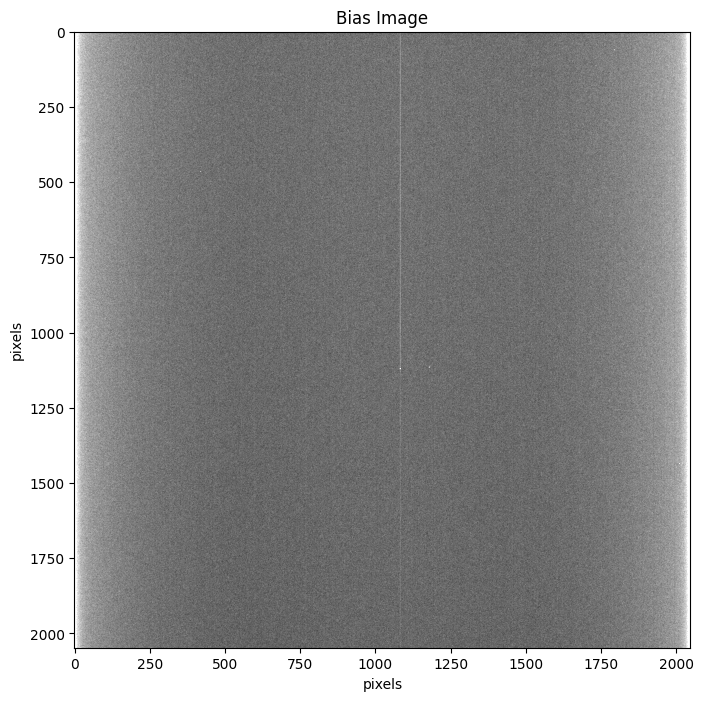

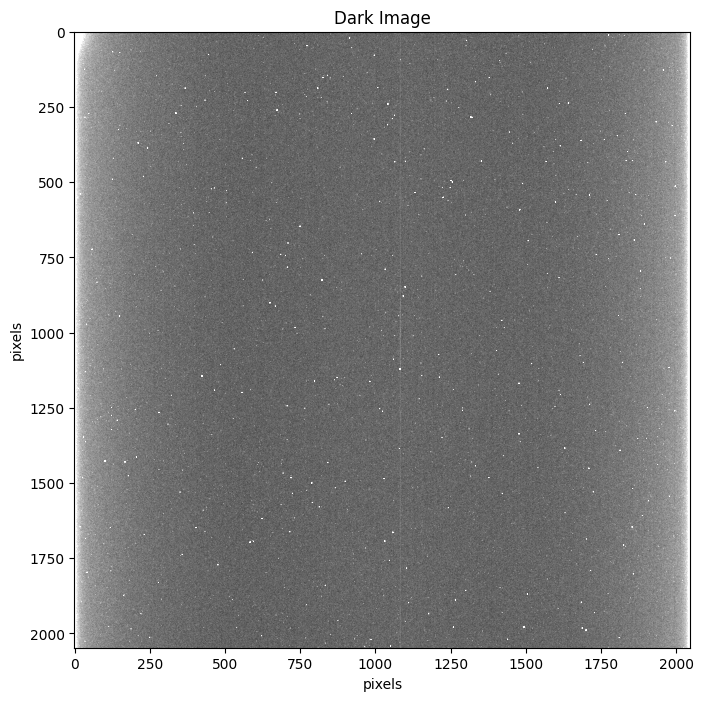

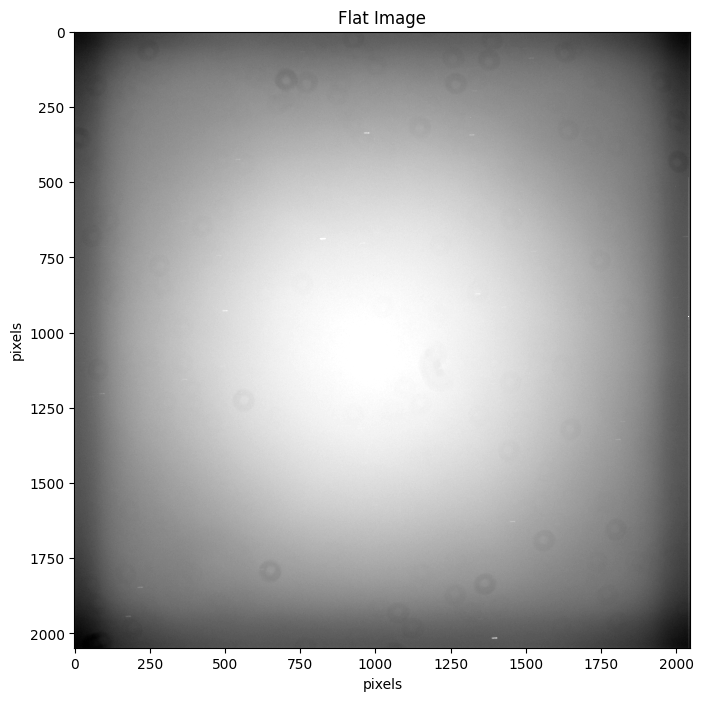

Center of Field (RA, Dec): ('05 24 07.53', '+26 58 50.5')
('05 24 07.53', '+26 58 50.5')


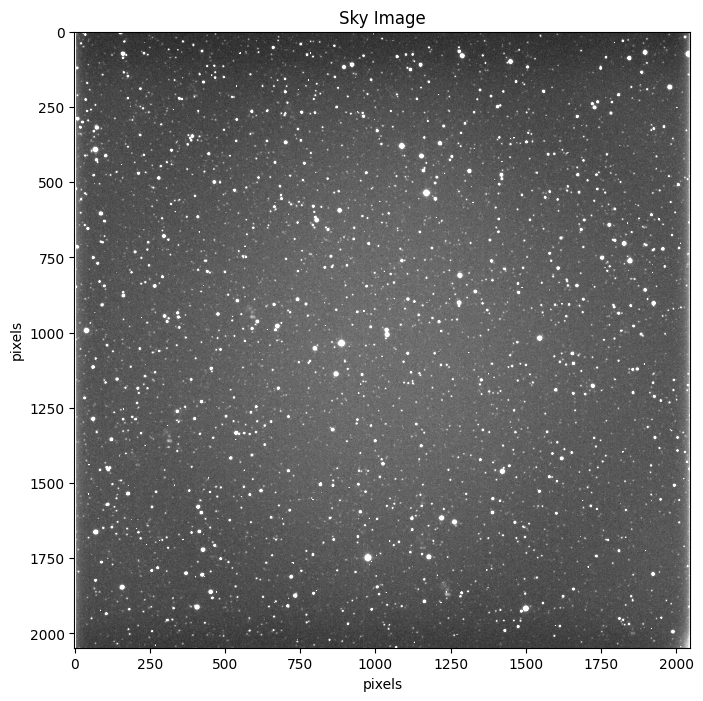

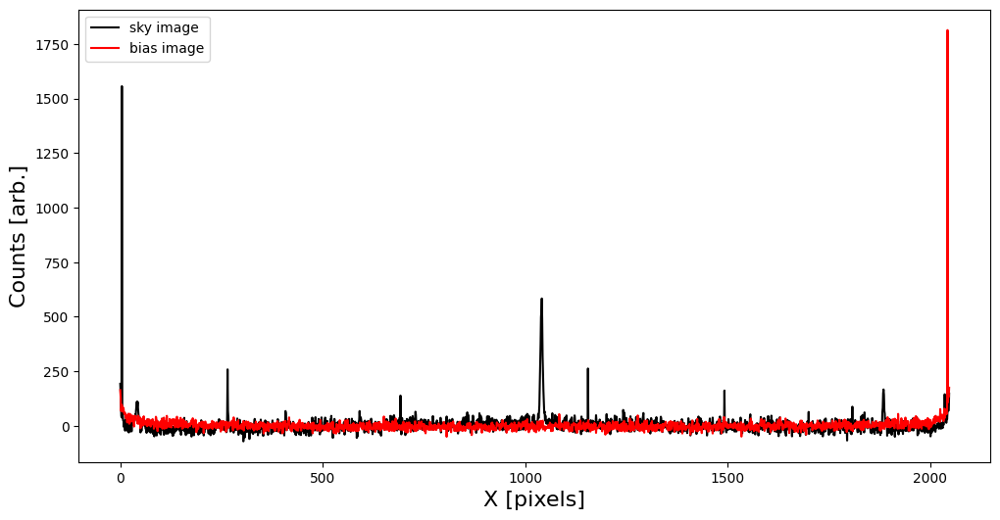

In [ ]:

header, bias, center_of_field = read_file(bias_files_19[0], verbose = False, sky_image=False)
plot_image(bias, title = "Bias Image", log = False)
header, dark, center_of_field = read_file(dark_files_19[0], verbose = False, sky_image=False)
plot_image(dark, title = "Dark Image", log = False)
header, flat, center_of_field = read_file(flat_files_19[0], verbose = False, sky_image=False)
plot_image(flat, title = "Flat Image", log = False)
header, img, center_of_field = read_file(asteroid_files_19[0], verbose = False, sky_image=True)
print(center_of_field)

"""print(header)
TALK ABOUT IMAGE FLIPPING
"""
# img = img[::-1,::-1]


plot_image(img, title = "Sky Image", log = False)

plt.figure(figsize=(12,6))
plt.plot(img[1000,:] - np.median(img[1000,:] ), label = 'sky image', color = 'k')
plt.plot(bias[1000,:] - np.median(bias[1000,:]), label = 'bias image', color = 'r')
plt.xlabel("X [pixels]" , size = 16)
plt.ylabel("Counts [arb.]" , size = 16)
plt.legend()
plt.show()


In [ ]:
# header, bias, center_of_field = read_file(bias_files_total[0], verbose = False, sky_image=False)
# header1, bias1, center_of_field1 = read_file(bias_files_total[1], verbose = False, sky_image=False)
# num_rows, num_columns = bias.shape
# num_rows1, num_columns1 = bias1.shape
# print(num_rows, num_columns)
# print(num_rows1, num_columns1)
# print(len(bias_files))

2048 2048
2048 2048
20


In [ ]:
# def get_median_of_2d_arrays(arrays):
#     # Flatten all arrays into a single 1D array
#     flattened_array = np.concatenate([np.ravel(array) for array in arrays])

#     # Calculate the median of the flattened array
#     median_value = np.median(flattened_array )


#     return median_value


# # Example usage:
# array1 = np.array([[1, 2, 3], [4, 5, 6]])
# array2 = np.array([[7, 8, 9], [10, 11, 12]])

# median_result = get_median_of_2d_arrays([array1, array2])
# print("Median of 2D arrays:", median_result)

Median of 2D arrays: 6.5


Median Bias File:
[[1157.  1101.5 1076.5 ... 1071.  1106.5 1156. ]
 [1157.  1093.  1075.  ... 1070.5 1114.5 1161. ]
 [1155.5 1096.  1073.5 ... 1088.5 1099.  1152.5]
 ...
 [1153.  1071.  1069.5 ... 1092.  1097.5 1150. ]
 [1137.5 1081.5 1059.5 ... 1087.  1102.5 1145. ]
 [1150.  1083.  1063.  ... 1082.  1101.5 1152.5]]


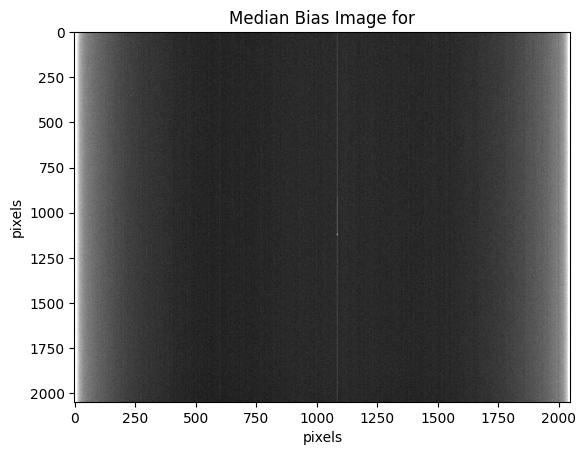

Median Bias File:
[[1167.5 1106.5 1081.5 ... 1074.  1117.  1156. ]
 [1155.5 1098.5 1079.5 ... 1086.  1103.5 1154. ]
 [1162.  1096.5 1090.  ... 1089.  1101.5 1153.5]
 ...
 [1151.  1089.  1072.  ... 1087.5 1107.  1145.5]
 [1143.  1088.5 1077.  ... 1075.  1111.  1144.5]
 [1154.5 1077.  1069.  ... 1081.5 1106.5 1169.5]]


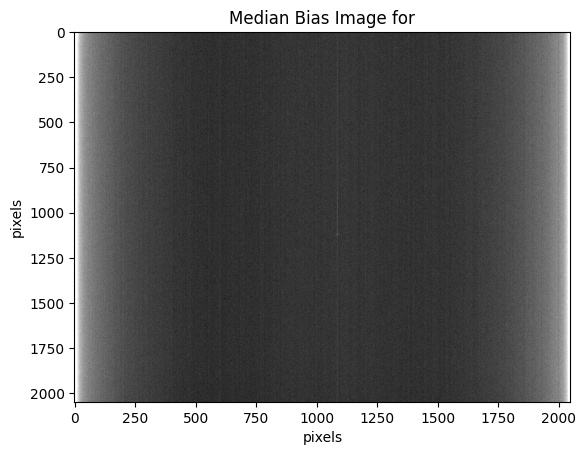

Median Bias File:
[[1159.  1091.5 1068.5 ... 1095.5 1105.  1163.5]
 [1163.  1084.  1074.  ... 1088.  1104.5 1153.5]
 [1161.  1095.  1080.  ... 1079.5 1126.5 1166.5]
 ...
 [1160.  1078.  1077.  ... 1081.5 1099.5 1169. ]
 [1143.5 1098.5 1067.5 ... 1080.5 1106.5 1155.5]
 [1149.  1097.  1076.5 ... 1082.  1103.  1164. ]]


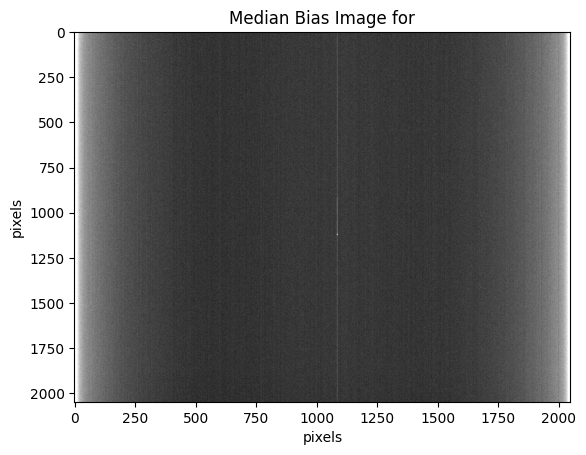

Median Bias File:
[[1158.  1090.  1077.5 ... 1075.5 1100.5 1161.5]
 [1157.  1095.5 1077.  ... 1084.  1099.  1151.5]
 [1155.5 1090.5 1073.5 ... 1071.  1110.5 1149.5]
 ...
 [1148.  1092.  1076.  ... 1073.5 1105.  1159. ]
 [1145.  1084.5 1064.5 ... 1077.  1098.5 1152.5]
 [1147.  1080.5 1067.  ... 1071.5 1104.  1159. ]]


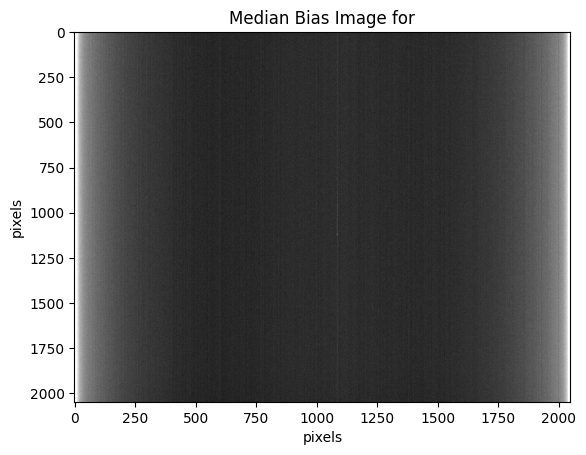

Median Flat File:
[[15605. 15433. 15463. ... 15060. 15268. 15408.]
 [15434. 15432. 15417. ... 15175. 15233. 15478.]
 [15436. 15522. 15469. ... 15163. 15166. 15326.]
 ...
 [14899. 14860. 14770. ... 15161. 15229. 15358.]
 [14902. 14902. 14842. ... 15247. 15223. 15385.]
 [14929. 14911. 14799. ... 15362. 15278. 15361.]]


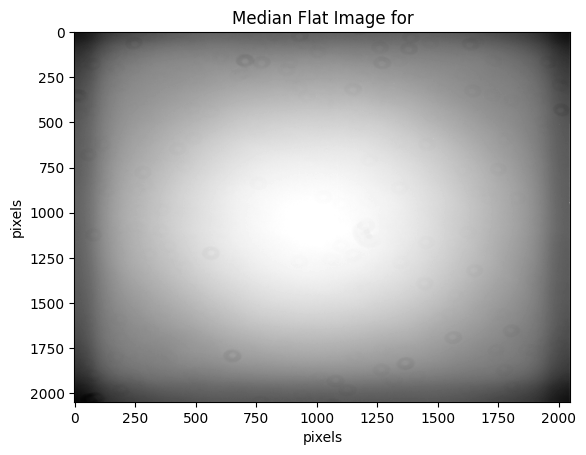

Median Flat File:
[[15600. 15656. 15427. ... 15259. 15564. 15653.]
 [15590. 15442. 15499. ... 15245. 15334. 15587.]
 [15521. 15697. 15606. ... 15405. 15387. 15499.]
 ...
 [15165. 15125. 15162. ... 15237. 15241. 15475.]
 [15213. 15110. 15045. ... 15217. 15383. 15511.]
 [15179. 15038. 15062. ... 15325. 15361. 15305.]]


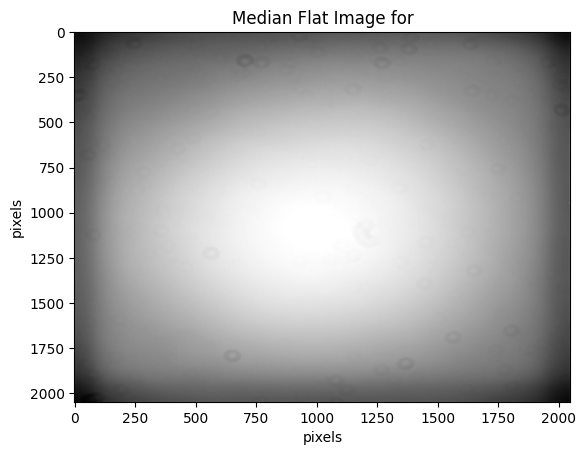

Median Flat File:
[[15182. 15208. 15073. ... 15040. 15108. 15332.]
 [15185. 15196. 14982. ... 15006. 15042. 15107.]
 [15109. 15206. 15257. ... 14922. 14930. 15120.]
 ...
 [14647. 14566. 14585. ... 15127. 15237. 15277.]
 [14714. 14718. 14565. ... 15080. 15215. 15216.]
 [14547. 14636. 14464. ... 15076. 15093. 15304.]]


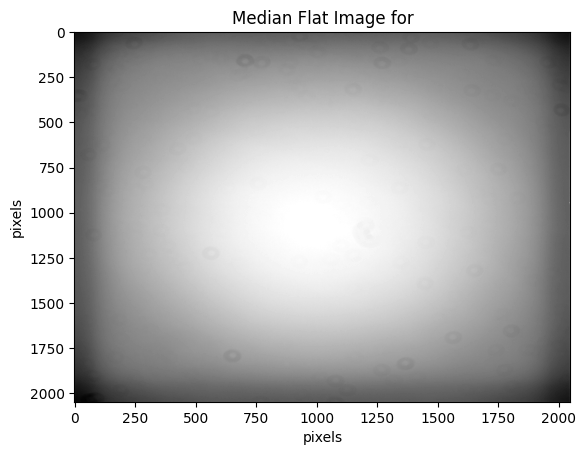

Median Flat File:
[[15182. 15208. 15073. ... 15040. 15108. 15332.]
 [15185. 15196. 14982. ... 15006. 15042. 15107.]
 [15109. 15206. 15257. ... 14922. 14930. 15120.]
 ...
 [14647. 14566. 14585. ... 15127. 15237. 15277.]
 [14714. 14718. 14565. ... 15080. 15215. 15216.]
 [14547. 14636. 14464. ... 15076. 15093. 15304.]]


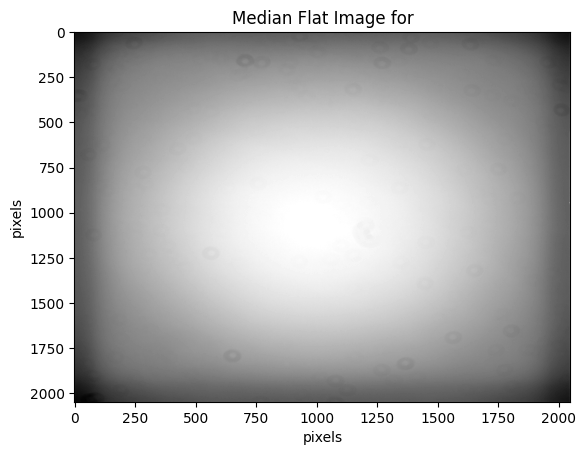

Median Dark File:
[[1312. 1228. 1182. ... 1079. 1104. 1158.]
 [1275. 1217. 1186. ... 1082. 1111. 1141.]
 [1278. 1207. 1181. ... 1085. 1087. 1162.]
 ...
 [1150. 1079. 1067. ... 1085. 1119. 1142.]
 [1137. 1084. 1079. ... 1106. 1114. 1159.]
 [1138. 1092. 1078. ... 1082. 1086. 1160.]]


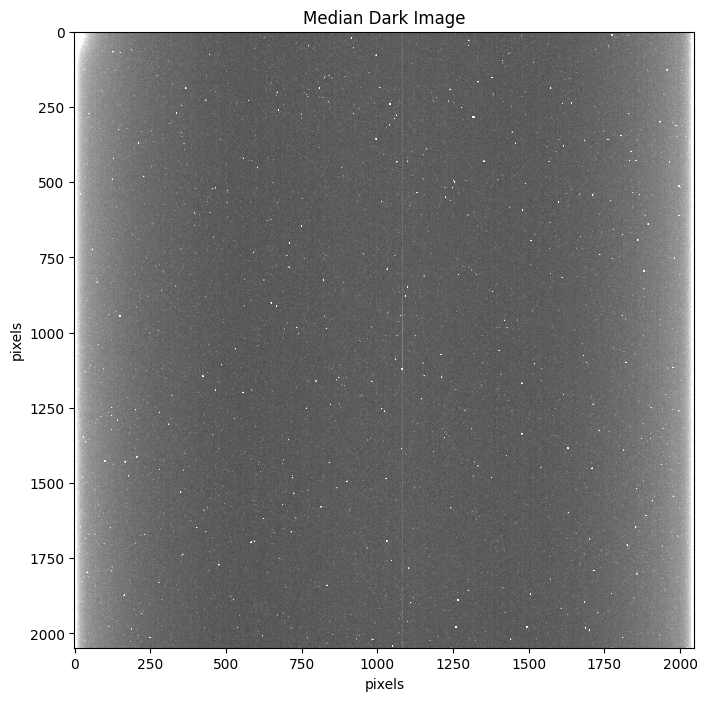

Median Dark File:
[[1290. 1230. 1190. ... 1073. 1101. 1162.]
 [1314. 1216. 1217. ... 1086. 1100. 1148.]
 [1294. 1213. 1180. ... 1083. 1117. 1157.]
 ...
 [1148. 1075. 1088. ... 1082. 1104. 1159.]
 [1159. 1095. 1062. ... 1072. 1116. 1149.]
 [1154. 1092. 1078. ... 1079. 1102. 1166.]]


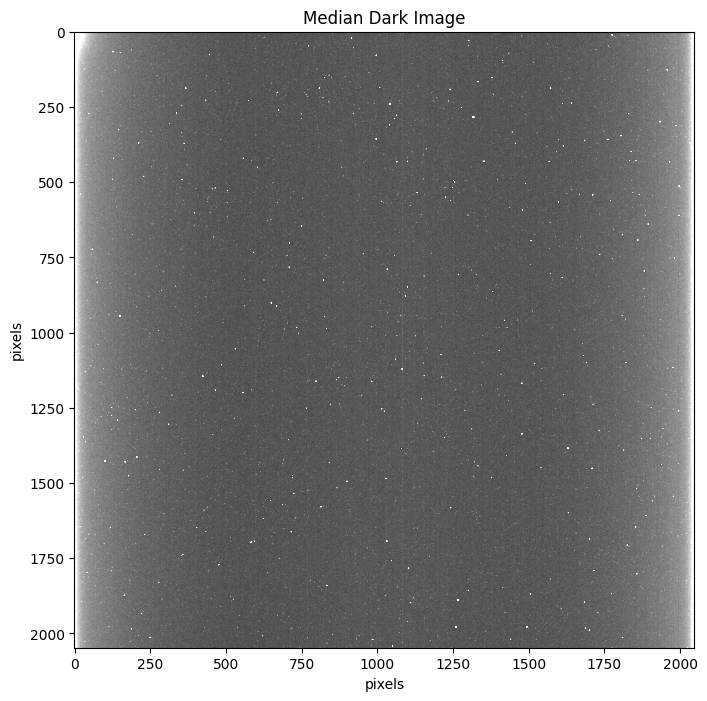

Median Dark File:
[[1290. 1221. 1174. ... 1072. 1125. 1151.]
 [1279. 1231. 1192. ... 1080. 1090. 1164.]
 [1256. 1235. 1172. ... 1096. 1100. 1161.]
 ...
 [1141. 1096. 1059. ... 1094. 1096. 1155.]
 [1134. 1109. 1076. ... 1084. 1100. 1163.]
 [1152. 1092. 1091. ... 1076. 1112. 1133.]]


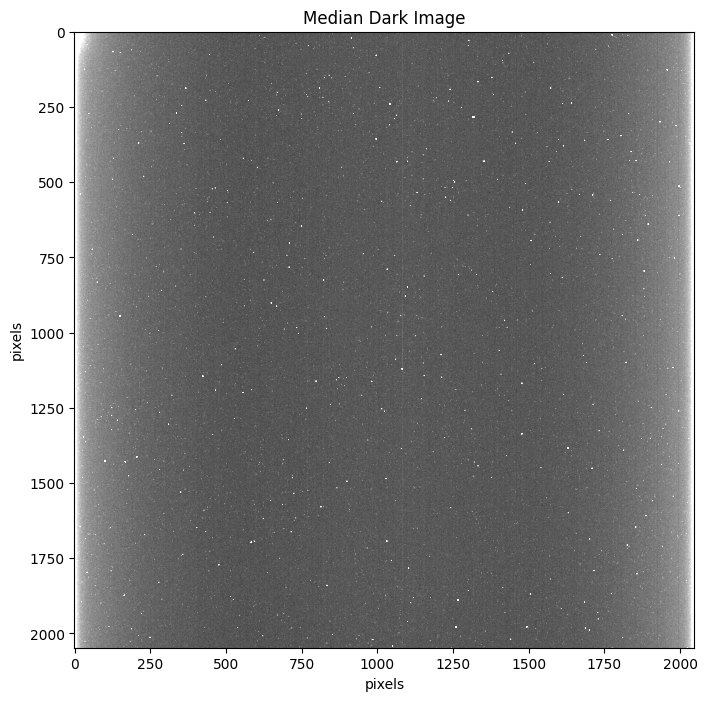

Median Dark File:
[[1262. 1189. 1178. ... 1079. 1103. 1154.]
 [1293. 1202. 1196. ... 1074. 1090. 1160.]
 [1278. 1207. 1157. ... 1075. 1106. 1146.]
 ...
 [1136. 1097. 1084. ... 1093. 1099. 1148.]
 [1131. 1095. 1056. ... 1077. 1102. 1151.]
 [1140. 1097. 1076. ... 1078. 1105. 1171.]]


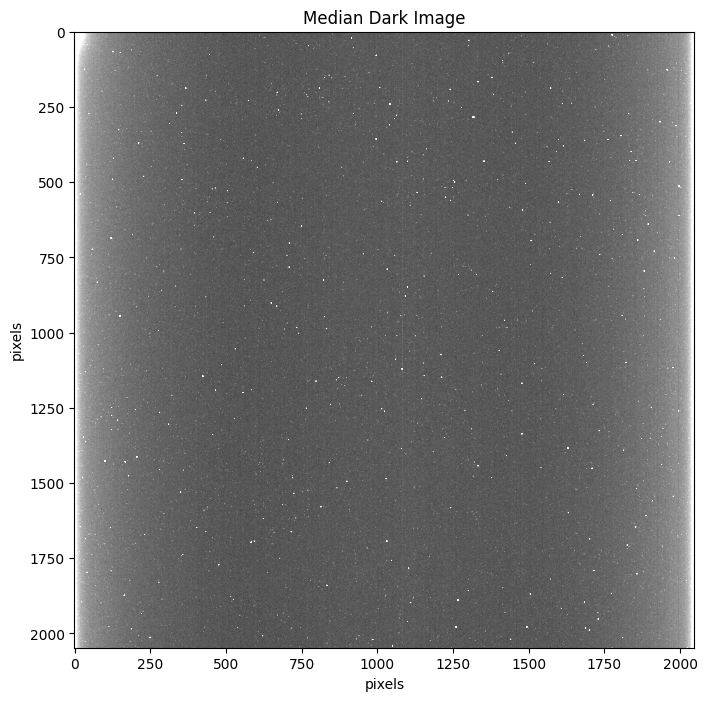

In [ ]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt

def read_bias_files(file_names):
    bias_files = []
    for filename in file_names:
        with fits.open(filename) as hdulist:
            # Assuming the data is in the primary HDU
            data = hdulist[0].data
            bias_files.append(data)
    return bias_files

def plot_2d_image(data, title="2D Image"):
    plt.imshow(data, cmap='gray', origin='lower', aspect='auto', vmin=955, vmax=1020)
    # plt.colorbar(label='Intensity')
    plt.title(title)
    plt.xlabel("pixels")
    plt.ylabel("pixels")
    plt.gca().invert_yaxis()
    plt.show()

bias_files = [bias_files_19, bias_files_20, bias_files_22, bias_files_25]
median_bias_files = []

for i in range(len(bias_files)):
    if bias_files[i]:
        bias_data = read_bias_files(bias_files[i])

        if bias_data:
            median_bias = np.median(bias_data, axis=0)

            # Print the median bias file as a 2D array
            print("Median Bias File:")
            print(median_bias)
            median_bias_files.append(median_bias)
            # Plot the 2D image of the median bias file
            plot_2d_image(median_bias, title="Median Bias Image for")
        else:
            print("Error reading bias files.")
    else:
        print("No bias files provided.")

median_bias_files = np.array(median_bias_files)


def read_flat_files(file_names):
    flat_files = []
    for filename in file_names:
        with fits.open(filename) as hdulist:
            # Assuming the data is in the primary HDU
            data2 = hdulist[0].data
            flat_files.append(data2)
    return flat_files

def plot_2d_image(data2, title="2D Image"):
    plt.imshow(data2, cmap='gray', origin='lower', aspect='auto', vmin = np.min(data2), vmax=np.percentile(data2,99))
    # plt.colorbar(label='Intensity')
    plt.title(title)
    plt.xlabel("pixels")
    plt.ylabel("pixels")
    plt.gca().invert_yaxis()
    plt.show()


flat_files = [flat_files_19, flat_files_20, flat_files_22, flat_files_25]
median_flat_files = []

for i in range(len(flat_files)):

      if flat_files[i]:
          flat_data = read_flat_files(flat_files[i])

          if flat_data:
              median_flat = np.median(flat_data, axis=0)

              # Print the median bias file as a 2D array
              print("Median Flat File:")
              print(median_flat)
              median_flat_files.append(median_flat)
              # Plot the 2D image of the median bias file
              plot_2d_image(median_flat, title="Median Flat Image for")
          else:
              print("Error reading flat files.")
      else:
          print("No flat files provided.")

median_flat_files = np.array(median_flat_files)








def read_dark_files_60s(file_names):
    dark_files_60s = []
    for filename in file_names:
        with fits.open(filename) as hdulist:
            # Assuming the data is in the primary HDU
            data3 = hdulist[0].data
            dark_files_60s.append(data3)
    return dark_files_60s

def plot_2d_image(data3, title="2D Image"):
    plt.figure(figsize=(8, 8))
    plt.imshow(data3, cmap='gray', origin='lower', aspect='auto', vmin = np.min(data3), vmax=np.percentile(data3,99))
    # plt.colorbar(label='Intensity ')
    plt.xlabel("pixels")
    plt.ylabel("pixels")
    plt.title(title)
    plt.gca().invert_yaxis()
    plt.show()

dark_files = [dark_files_19, dark_files_20, dark_files_22, dark_files_25]
median_dark_files =[]

for i in range(len(dark_files)):
    if dark_files[i]:
        dark_files_data = read_dark_files_60s(dark_files[i])

        if dark_files_data:
            median_dark = np.median(dark_files_data, axis=0)

            # Print the median bias file as a 2D array
            print("Median Dark File:")
            print(median_dark)
            median_dark_files.append(median_dark)
            # Plot the 2D image of the median bias file
            plot_2d_image(median_dark, title="Median Dark Image")
        else:
            print("Error reading flat files.")
    else:
        print("No flat files provided.")

median_dark_files = np.array(median_dark_files)





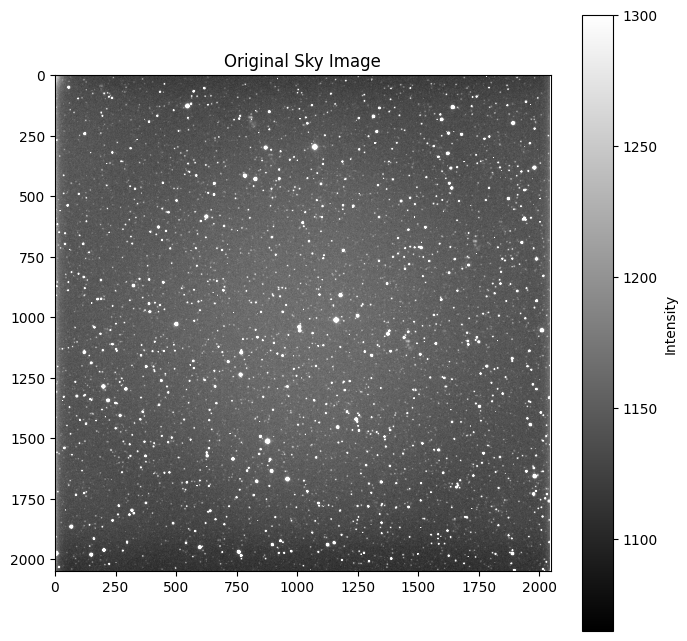

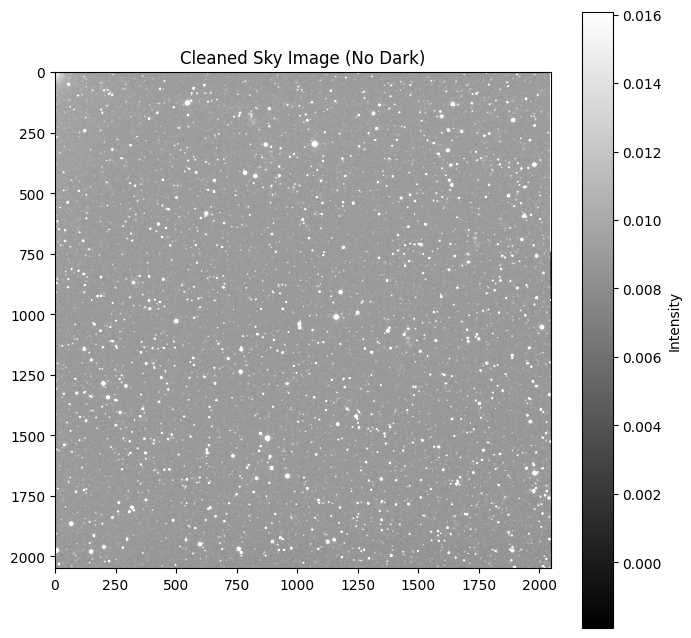

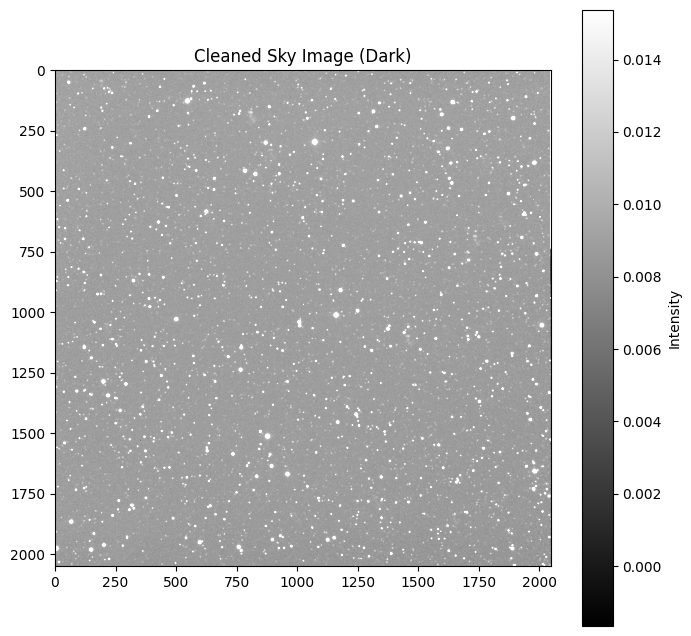

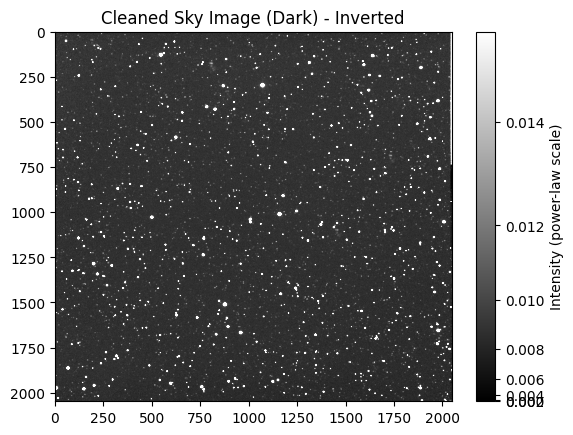

In [ ]:
# clean_img_no_dark = (img - median_bias )/(median_flat)
# clean_img_dark_unedited = (img- median_dark_files_60s)/(median_flat)
# plot_image(img, title =  "Original Sky Image", log = True)
# plot_image(clean_img_no_dark, title =  "Cleaned Sky Image (No Dark)",  log = True)
# plot_image(clean_img_dark_unedited,  title =  "Cleaned Sky Image (Dark)",  log = True)


# # Assuming clean_img_dark_unedited is your original data
# clean_img_dark_edited = clean_img_dark_unedited  # Invert the values


# from matplotlib.colors import PowerNorm

# # Use a small positive offset for vmin to avoid log of zero or negative numbers
# offset = 1e-10
# vmin = np.max([offset, np.min(clean_img_dark_edited)])
# vmax = np.percentile(clean_img_dark_edited, 99)

# # Increase the scaling factor to enhance visibility of faint points
# scaling_factor = 3

# # Power-law normalization to enhance visibility of faint points
# norm = PowerNorm(gamma=scaling_factor, vmin=vmin, vmax=vmax)

# # Use the 'inferno' colormap for better visibility
# plt.imshow(clean_img_dark_edited, cmap='gray', origin='lower', aspect='auto', norm=norm)
# cbar = plt.colorbar(label='Intensity (power-law scale)')  # Use scientific notation for the colorbar labels
# plt.title("Cleaned Sky Image (Dark) - Inverted")
# plt.gca().invert_yaxis()
# plt.show()

In [ ]:
print(len(asteroid_files_total))

NameError: name 'asteroid_files_total' is not defined

Center of Field (RA, Dec): ('05 24 07.53', '+26 58 50.5')


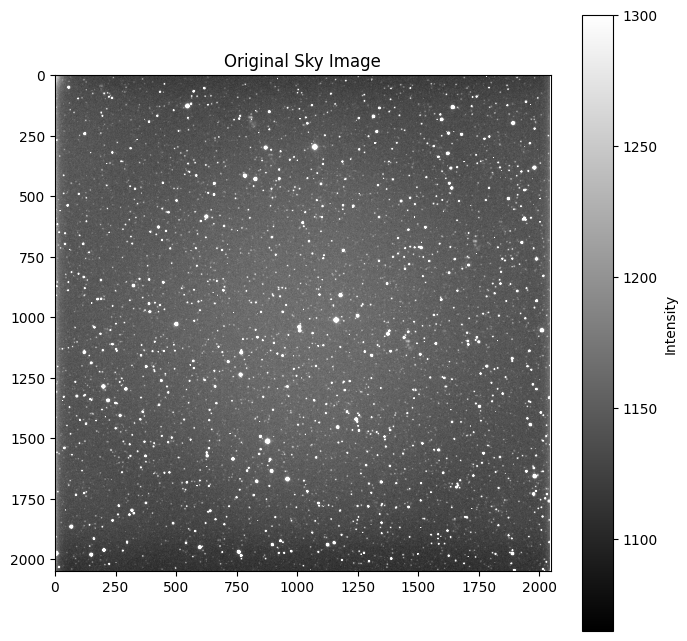

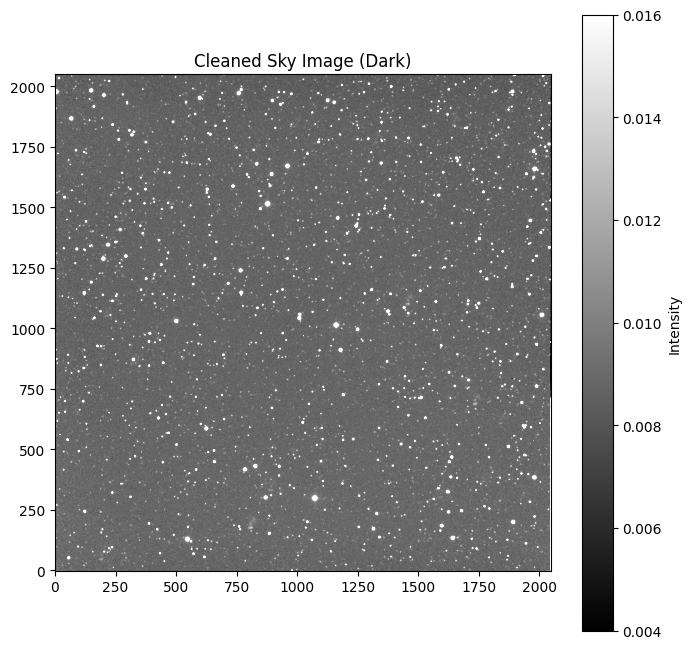

Center of Field (RA, Dec): ('05 24 07.53', '+26 58 50.5')


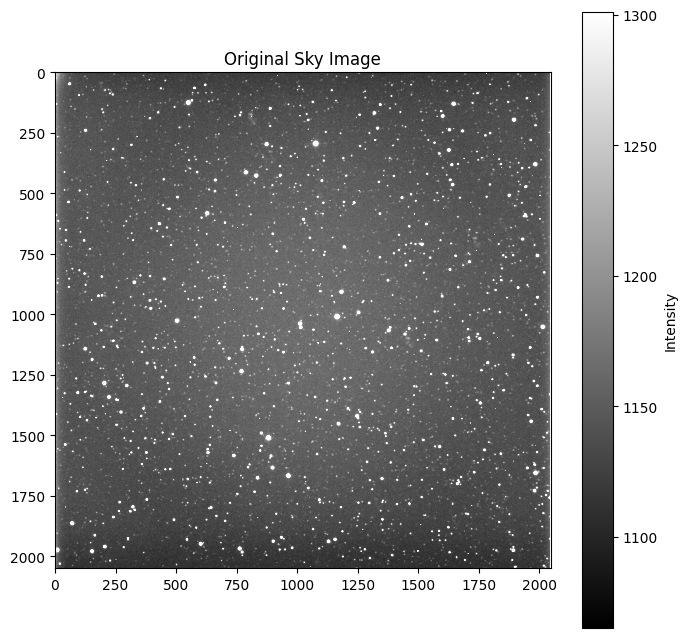

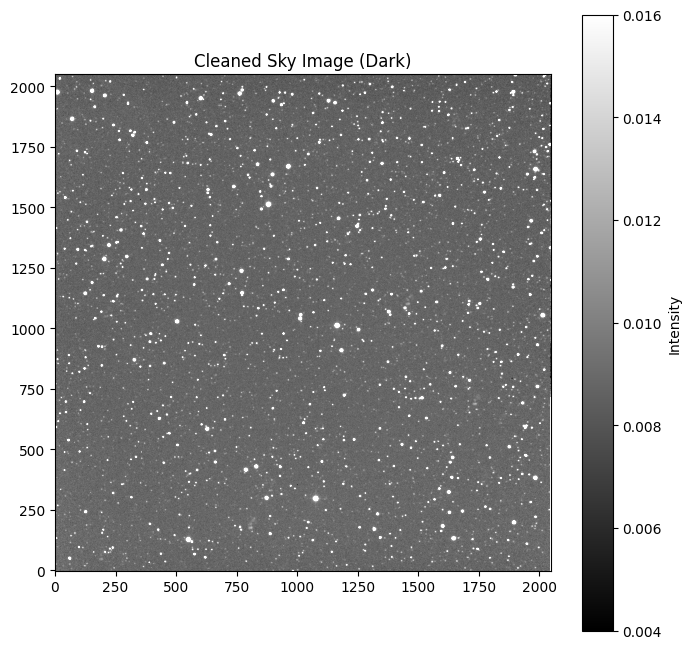

Center of Field (RA, Dec): ('05 24 07.53', '+26 58 50.5')


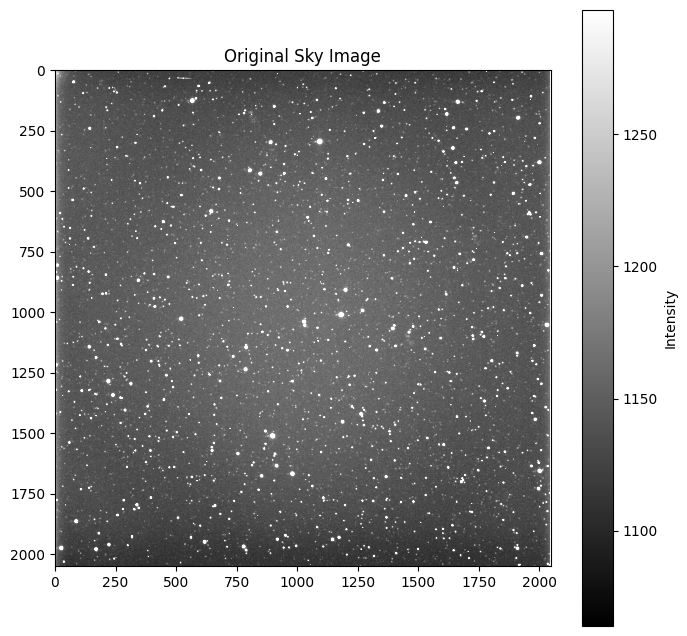

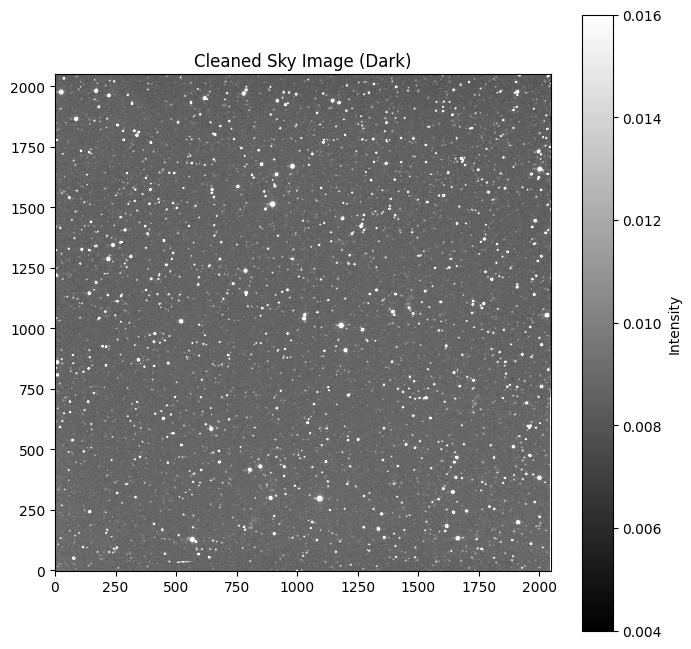

In [ ]:
for i in range(len(asteroid_files_19)):
  header, img, center_of_field = read_file(asteroid_files_19[i], verbose = False, sky_image=True)
  img = img[::-1,::-1]
  clean_img_no_dark = (img - median_bias_files[0] )/(median_flat_files[0])
  clean_img_dark = (img - median_dark_files[0])/(median_flat_files[0])
  plot_image(img, title =  "Original Sky Image", log = True)
  #plot_image(clean_img_no_dark, title =  "Cleaned Sky Image (No Dark)", log = True)
  #plot_image(clean_img_dark, title =  "Cleaned Sky Image (Dark)", log = True)
  hdu = fits.PrimaryHDU(clean_img_dark)
  hdul = fits.HDUList([hdu])
  hdul.writeto(f'/content/drive/MyDrive/26Proserpina/Cleaned/cleaned_20120119_{i}.fits', overwrite=True)


  plt.figure(figsize=(8, 8))
  plt.imshow(clean_img_dark, cmap='gray', vmin=0.004, vmax=0.016, origin = 'lower')
  plt.title( "Cleaned Sky Image (Dark)")
  plt.colorbar(label='Intensity')
  plt.show()


Center of Field (RA, Dec): ('05 23 34.06', '+26 58 06.5')


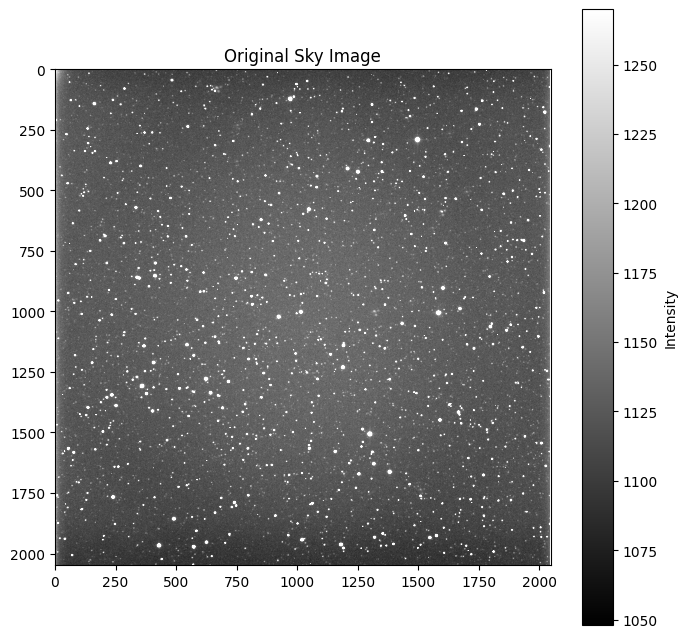

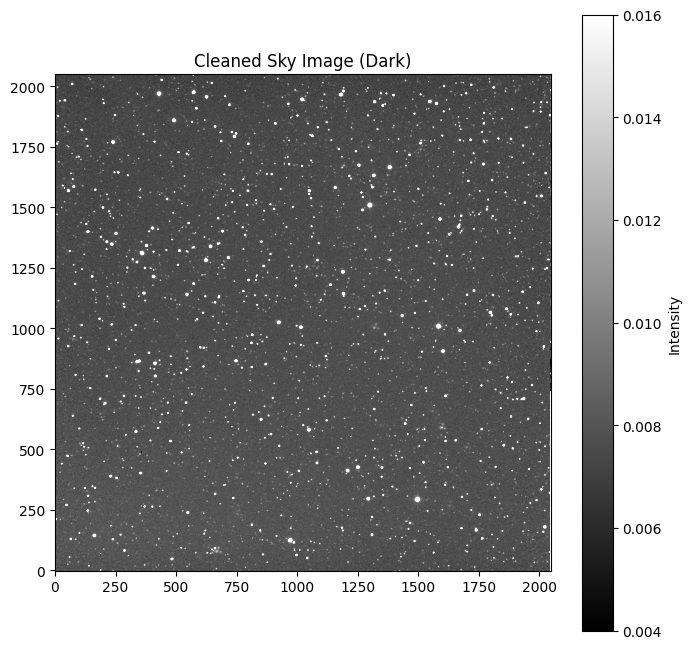

Center of Field (RA, Dec): ('05 23 34.06', '+26 58 06.5')


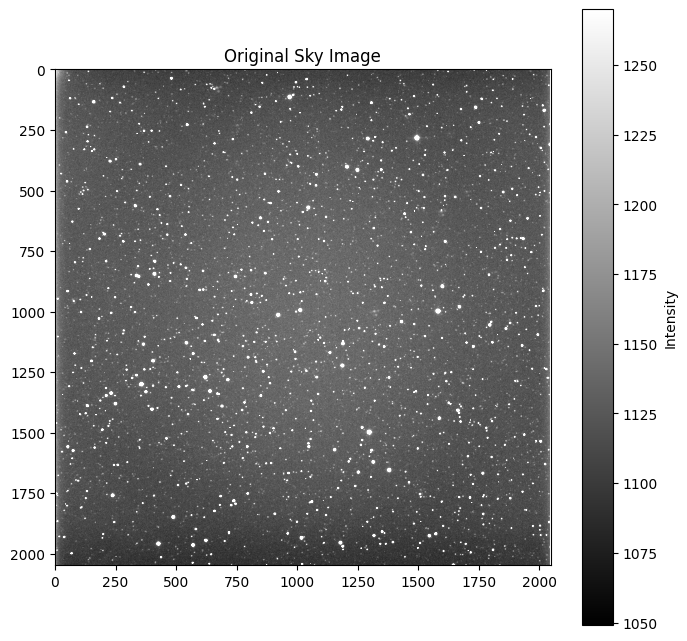

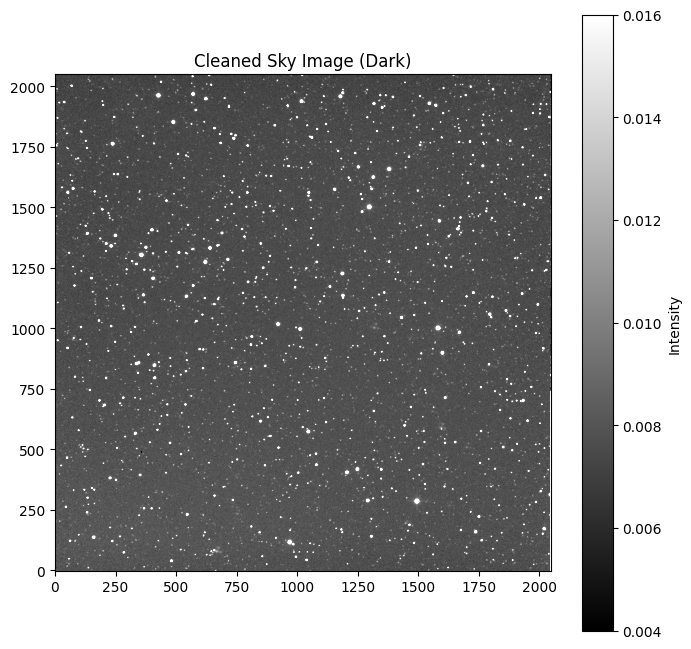

Center of Field (RA, Dec): ('05 23 34.06', '+26 58 06.5')


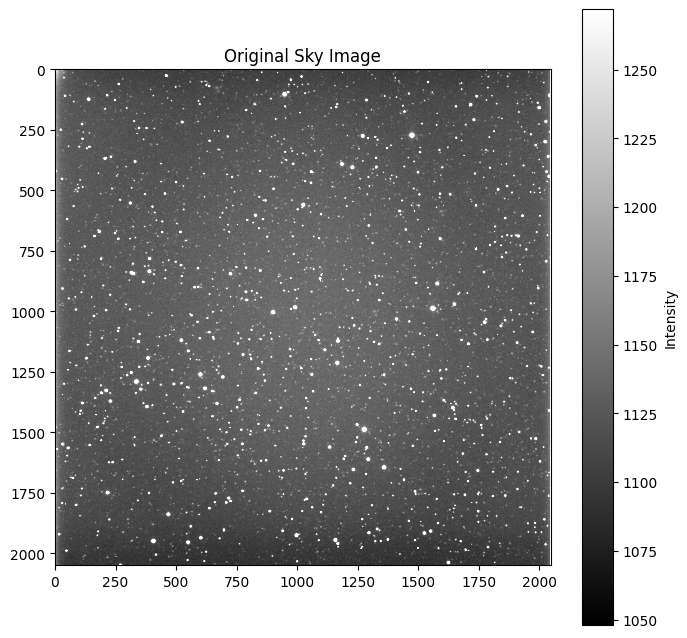

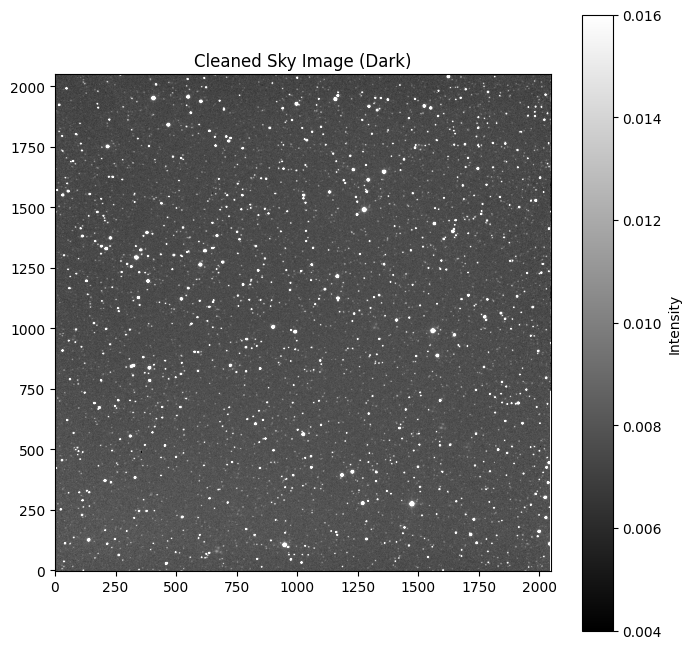

In [ ]:
for i in range(len(asteroid_files_20)):
  header, img, center_of_field = read_file(asteroid_files_20[i], verbose = False, sky_image=True)
  img = img[::-1,::-1]
  clean_img_no_dark = (img - median_bias_files[1] )/(median_bias_files[1] - median_flat_files[1])
  clean_img_dark = (img - median_dark_files[1])/(median_bias_files[1] - median_flat_files[1])
  plot_image(img, title =  "Original Sky Image", log = True)
  #plot_image(clean_img_no_dark, title =  "Cleaned Sky Image (No Dark)", log = True)
  #plot_image(clean_img_dark, title =  "Cleaned Sky Image (Dark)", log = True)
  hdu = fits.PrimaryHDU(clean_img_dark)
  hdul = fits.HDUList([hdu])
  hdul.writeto(f'/content/drive/MyDrive/26Proserpina/Cleaned/cleaned_20120120_{i}.fits', overwrite=True)


  plt.figure(figsize=(8, 8))
  plt.imshow(clean_img_dark, cmap='gray', vmin=0.004, vmax=0.016, origin = 'lower')
  plt.title( "Cleaned Sky Image (Dark)")
  plt.colorbar(label='Intensity')
  plt.show()

Center of Field (RA, Dec): ('05 22 32.19', '+26 56 37.2')


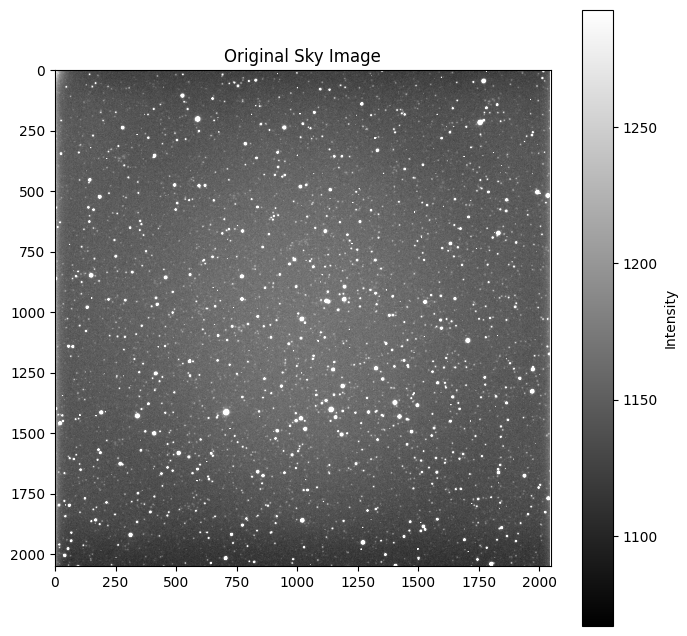

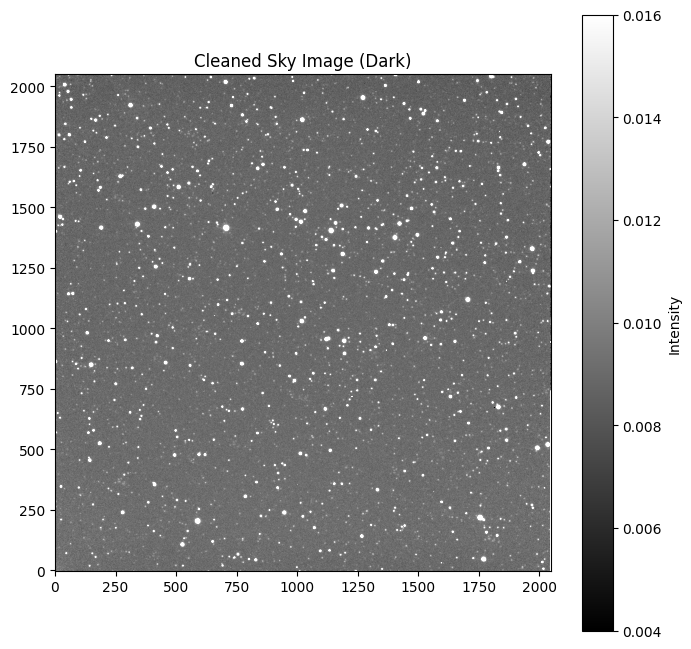

Center of Field (RA, Dec): ('05 22 32.19', '+26 56 37.2')


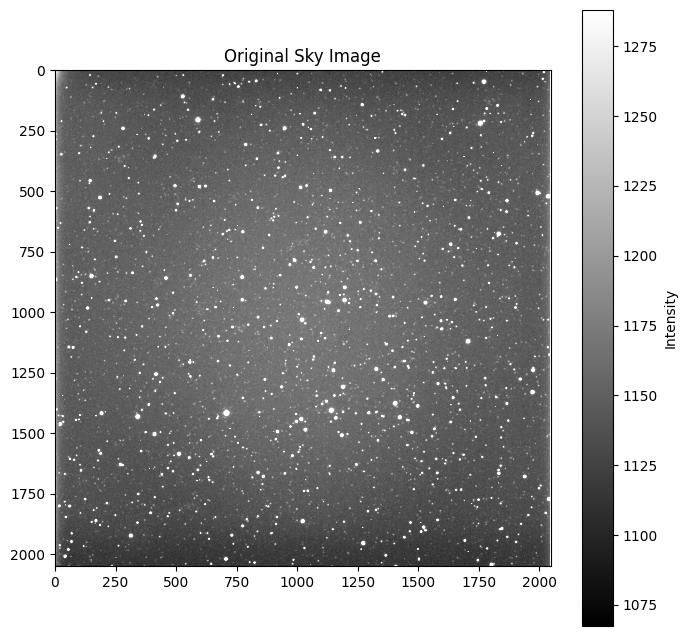

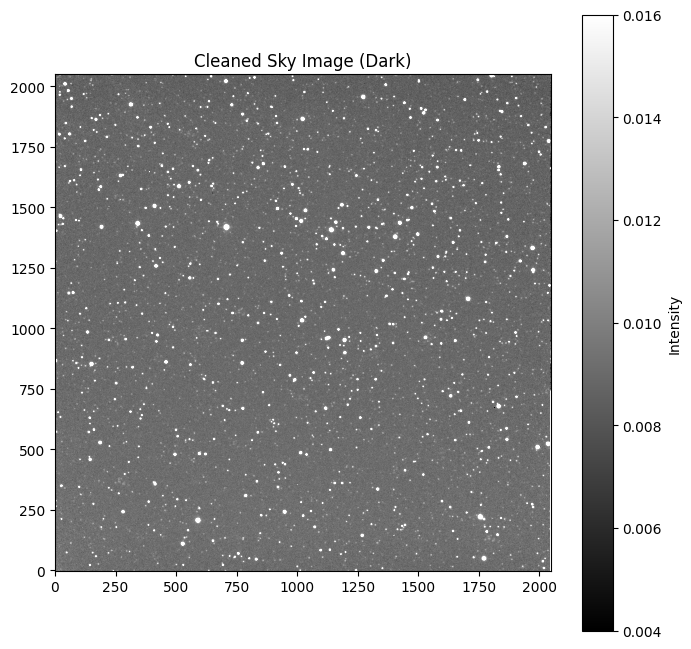

Center of Field (RA, Dec): ('05 22 32.19', '+26 56 37.2')


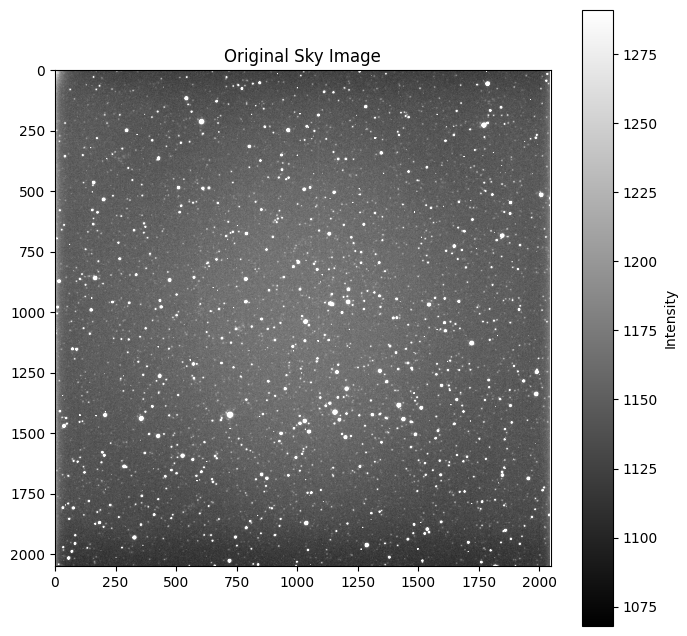

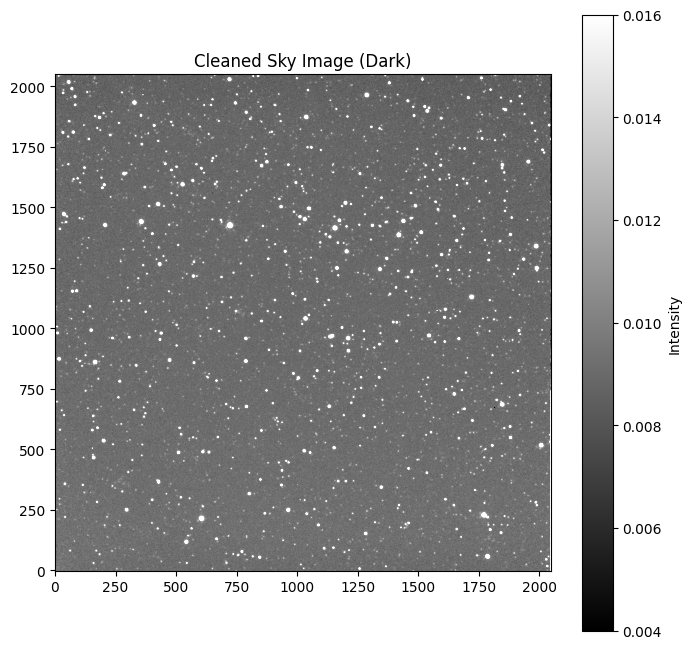

In [ ]:
for i in range(len(asteroid_files_22)):
  header, img, center_of_field = read_file(asteroid_files_22[i], verbose = False, sky_image=True)
  img = img[::-1,::-1]
  clean_img_no_dark = (img - median_bias_files[2] )/(median_flat_files[2])
  clean_img_dark = (img - median_dark_files[2])/(median_flat_files[2])
  plot_image(img, title =  "Original Sky Image", log = True)
  #plot_image(clean_img_no_dark, title =  "Cleaned Sky Image (No Dark)", log = True)
  #plot_image(clean_img_dark, title =  "Cleaned Sky Image (Dark)", log = True)
  hdu = fits.PrimaryHDU(clean_img_dark)
  hdul = fits.HDUList([hdu])
  hdul.writeto(f'/content/drive/MyDrive/26Proserpina/Cleaned/cleaned_20120122_{i}.fits', overwrite=True)

  plt.figure(figsize=(8, 8))
  plt.imshow(clean_img_dark, cmap='gray', vmin=0.004, vmax=0.016, origin = 'lower')
  plt.title( "Cleaned Sky Image (Dark)")
  plt.colorbar(label='Intensity')
  plt.show()

Center of Field (RA, Dec): ('05 22 03.84', '+26 55 52.1')


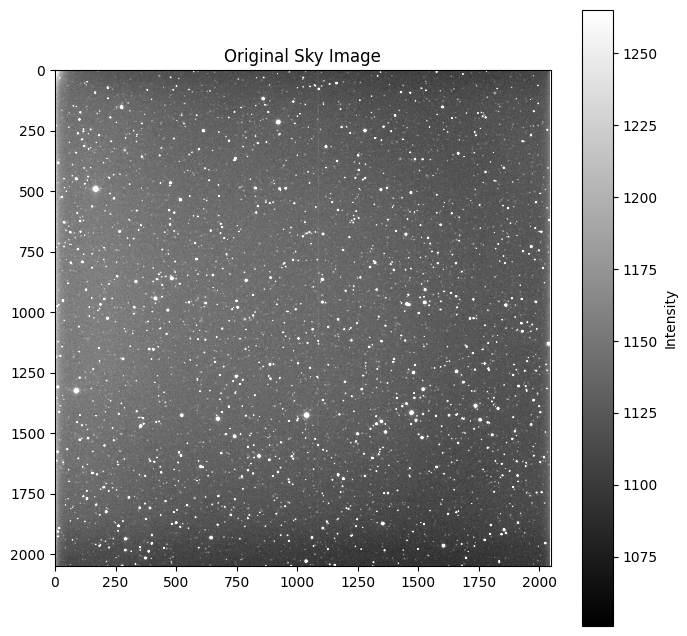

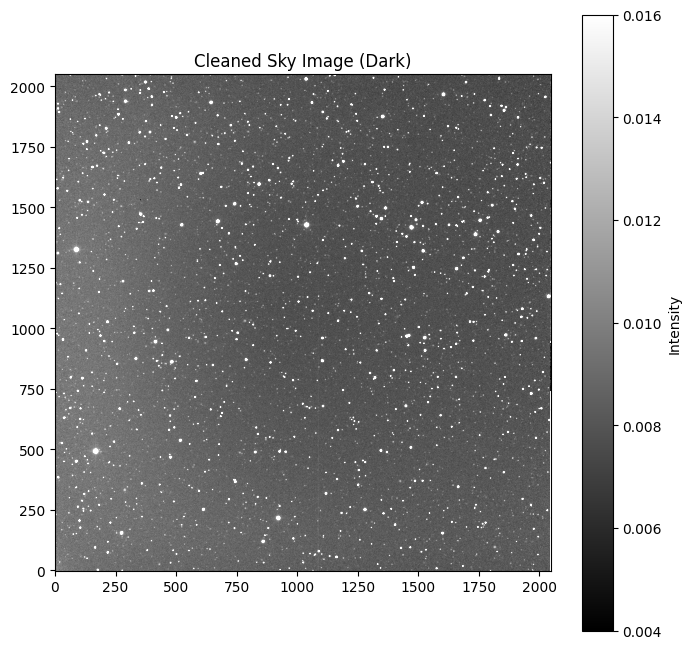

Center of Field (RA, Dec): ('05 22 03.84', '+26 55 52.1')


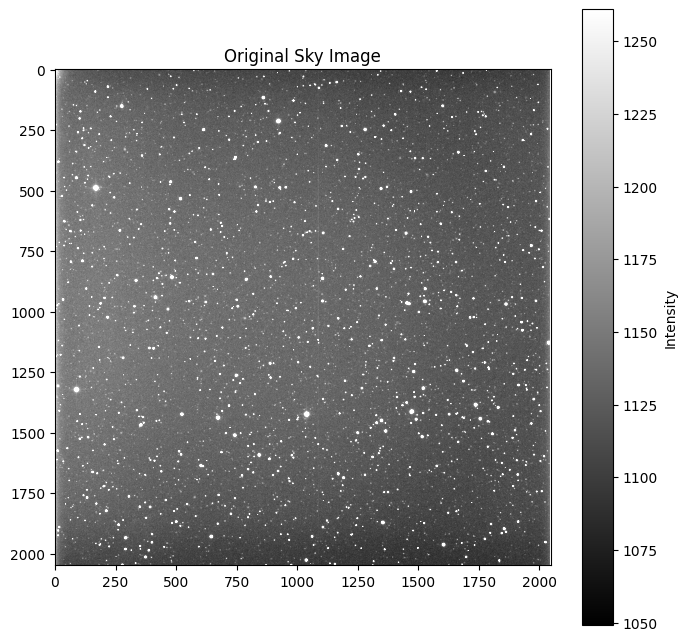

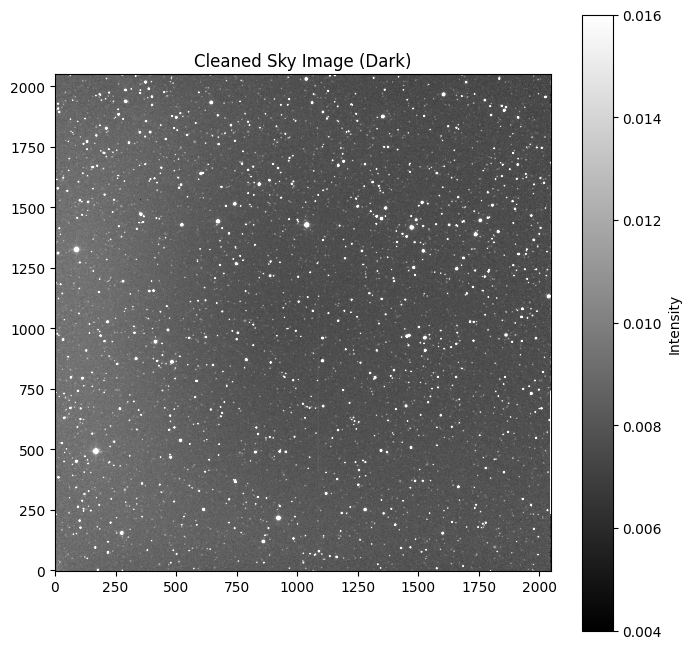

Center of Field (RA, Dec): ('05 22 03.84', '+26 55 52.1')


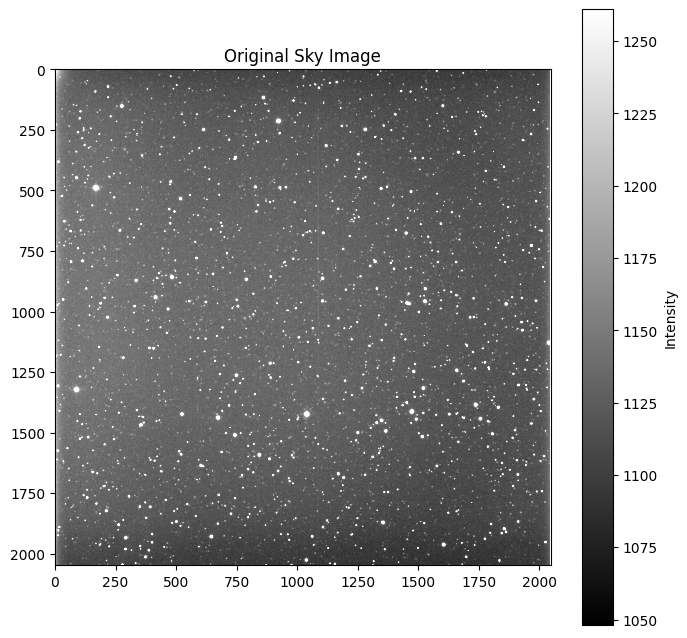

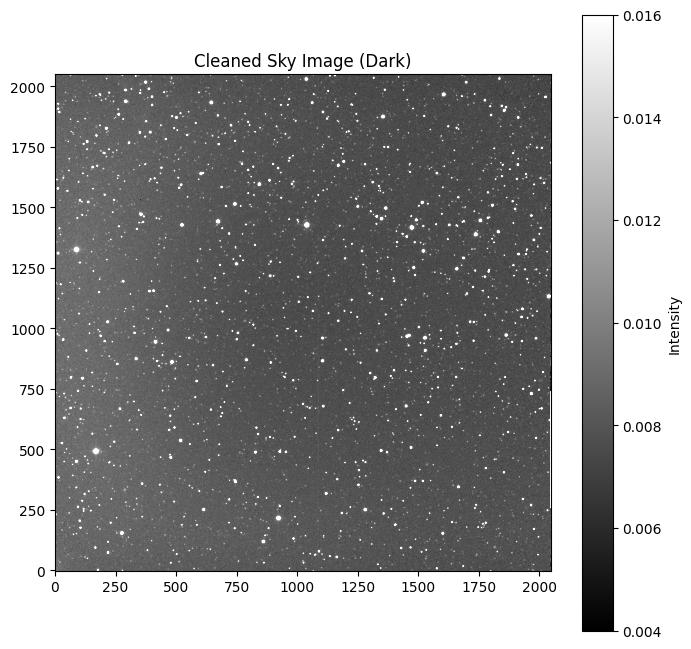

In [ ]:
for i in range(len(asteroid_files_25)):
  header, img, center_of_field = read_file(asteroid_files_25[i], verbose = False, sky_image=True)
  img = img[::-1,::-1]
  clean_img_no_dark = (img - median_bias_files[3] )/(median_flat_files[3])
  clean_img_dark = (img - median_dark_files[3])/(median_flat_files[3])
  plot_image(img, title =  "Original Sky Image", log = True)
  #plot_image(clean_img_no_dark, title =  "Cleaned Sky Image (No Dark)", log = True)
  #plot_image(clean_img_dark, title =  "Cleaned Sky Image (Dark)", log = True)
  hdu = fits.PrimaryHDU(clean_img_dark)
  hdul = fits.HDUList([hdu])
  hdul.writeto(f'/content/drive/MyDrive/26Proserpina/Cleaned/cleaned_20120125_{i}.fits', overwrite=True)

  plt.figure(figsize=(8, 8))
  plt.imshow(clean_img_dark, cmap='gray', vmin=0.004, vmax=0.016, origin = 'lower')
  plt.title( "Cleaned Sky Image (Dark)")
  plt.colorbar(label='Intensity')
  plt.show()